In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns

import missingno as msno

import warnings
warnings.filterwarnings('ignore')
sns.set_style('darkgrid')

In [ ]:
df=pd.read_csv(r'C:\Users\kelvi\OneDrive\Desktop\semister-1 msaiml\ML\ML_project\dataset_fifa\players_22.csv')

In [ ]:
df.head().T

,0,1,2,3,4
sofifa_id,158023,188545,20801,190871,192985
player_url,https://sofifa.com/player/158023/lionel-messi/...,https://sofifa.com/player/188545/robert-lewand...,https://sofifa.com/player/20801/c-ronaldo-dos-...,https://sofifa.com/player/190871/neymar-da-sil...,https://sofifa.com/player/192985/kevin-de-bruy...
short_name,L. Messi,R. Lewandowski,Cristiano Ronaldo,Neymar Jr,K. De Bruyne
long_name,Lionel Andrés Messi Cuccittini,Robert Lewandowski,Cristiano Ronaldo dos Santos Aveiro,Neymar da Silva Santos Júnior,Kevin De Bruyne
player_positions,"RW, ST, CF",ST,"ST, LW","LW, CAM","CM, CAM"
...,...,...,...,...,...
player_face_url,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/players/192/985/22_120.png
club_logo_url,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/teams/10/60.png
club_flag_url,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/flags/gb-eng.png
nation_logo_url,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/teams/1354/60.png,NaN,https://cdn.sofifa.net/teams/1325/60.png


In [ ]:
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name',
       'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur',
       'age',
       ...
       'lcb', 'cb', 'rcb', 'rb', 'gk', 'player_face_url', 'club_logo_url',
       'club_flag_url', 'nation_logo_url', 'nation_flag_url'],
      dtype='object', length=110)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Columns: 110 entries, sofifa_id to nation_flag_url
dtypes: float64(16), int64(44), object(50)
memory usage: 16.1+ MB


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sofifa_id,19239.0,2.314681e+05,2.703972e+04,41.0,214413.5,236543.0,253532.5,264640.0
overall,19239.0,6.577218e+01,6.880232e+00,47.0,61.0,66.0,70.0,93.0
potential,19239.0,7.107937e+01,6.086213e+00,49.0,67.0,71.0,75.0,95.0
value_eur,19165.0,2.850452e+06,7.613700e+06,9000.0,475000.0,975000.0,2000000.0,194000000.0
wage_eur,19178.0,9.017989e+03,1.947018e+04,500.0,1000.0,3000.0,8000.0,350000.0
age,19239.0,2.521082e+01,4.748235e+00,16.0,21.0,25.0,29.0,54.0
height_cm,19239.0,1.812997e+02,6.863179e+00,155.0,176.0,181.0,186.0,206.0
weight_kg,19239.0,7.494303e+01,7.069434e+00,49.0,70.0,75.0,80.0,110.0
club_team_id,19178.0,5.058050e+04,5.440187e+04,1.0,479.0,1938.0,111139.0,115820.0
league_level,19178.0,1.354364e+00,7.478651e-01,1.0,1.0,1.0,1.0,5.0


In [ ]:
print(df.columns) # Print the columns to inspect for typos or case sensitivity issues

# Check if the columns exist before attempting to drop them
columns_to_drop = ['player_face_url', 'club_logo_url', 'club_flag_url', 'nation_logo_url', 'nation_flag_url']
existing_columns = [col for col in columns_to_drop if col in df.columns]

if existing_columns:
  df.drop(existing_columns, axis=1, inplace=True)
else:
  print("Columns not found in DataFrame")

Index(['sofifa_id', 'player_url', 'short_name', 'long_name',
       'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur',
       'age',
       ...
       'lcb', 'cb', 'rcb', 'rb', 'gk', 'player_face_url', 'club_logo_url',
       'club_flag_url', 'nation_logo_url', 'nation_flag_url'],
      dtype='object', length=110)


<Axes: >

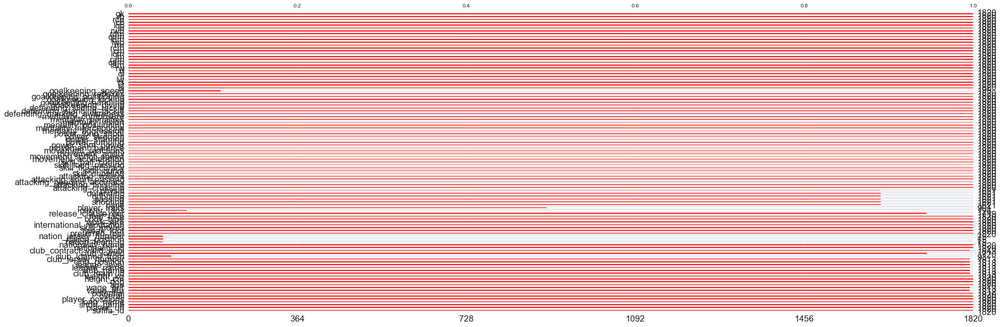

In [ ]:
msno.bar(df.sample( 1820 ),(28,10),color='red')

In [ ]:
df.isnull().sum()

sofifa_id           0
player_url          0
short_name          0
long_name           0
player_positions    0
                   ..
lcb                 0
cb                  0
rcb                 0
rb                  0
gk                  0
Length: 105, dtype: int64

In [ ]:
# Find the indices of missing values in the height and weight columns
missing_height = df[df['height_cm'].isnull()].index.tolist()
missing_weight = df[df['weight_kg'].isnull()].index.tolist()

# Compare if the missing indices are the same for both height and weight
if set(missing_height) == set(missing_weight):
    print('The indices of missing values in height and weight are the same.')
else:
    print('The indices of missing values in height and weight are different.')


The indices of missing values in height and weight are the same.


In [ ]:
df.drop(df.index[missing_height],inplace =True)

In [ ]:
# Find indices where both height and weight are missing
missing_height = df[df['height_cm'].isnull()].index.tolist()
missing_weight = df[df['weight_kg'].isnull()].index.tolist()

# Check if missing indices for height and weight are the same
if set(missing_height) == set(missing_weight):
    # If they are the same, drop the rows with missing height and weight
    df.drop(df.index[missing_height], inplace=True)
    print(f"Dropped {len(missing_height)} rows where both height and weight are missing.")
else:
    print("The indices of missing values in height and weight are different. No rows were dropped.")


Dropped 0 rows where both height and weight are missing.


In [ ]:
df.isnull().sum()

,0
sofifa_id,0
player_url,0
short_name,0
long_name,0
player_positions,0
...,...
lcb,0
cb,0
rcb,0
rb,0


In [ ]:
# Dropping columns related to loan, release clause, and club joining details
df.drop(['club_loaned_from', 'release_clause_eur', 'club_joined'], axis=1, inplace=True)

# Confirming that the columns were dropped
print(df.columns)


Index(['sofifa_id', 'player_url', 'short_name', 'long_name',
       'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur',
       'age',
       ...
       'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb', 'gk'],
      dtype='object', length=102)


In [ ]:
# Number of unique countries (nationalities) available
print('Total number of countries: {0}'.format(df['nationality_name'].nunique()))

# Top 5 countries with the highest number of players
top_5_countries = df['nationality_name'].value_counts().head(5)
print(top_5_countries)

print('--' * 40)

# Conclusion about European countries
print("\nEuropean countries have the most players.")


Total number of countries: 163
nationality_name
England      1719
Germany      1214
Spain        1086
France        980
Argentina     960
Name: count, dtype: int64
--------------------------------------------------------------------------------

European countries have the most players.


In [ ]:
# If you're trying to access the 'club_name' column instead of 'Club'
try:
    print(df['club_name'].head())  # Example of accessing the club_name column
except KeyError:
    print("The column 'club_name' does not exist in the DataFrame.")
# Example of counting the number of players by club
club_player_count = df['club_name'].value_counts().head(5)
print(club_player_count)


0    Paris Saint-Germain
1      FC Bayern München
2      Manchester United
3    Paris Saint-Germain
4        Manchester City
Name: club_name, dtype: object
club_name
Paris Saint-Germain    33
RC Celta de Vigo       33
Everton                33
Real Betis Balompié    33
Burnley                33
Name: count, dtype: int64


In [ ]:
import pandas as pd

# Loading dataset assuming it has the mentioned columns (you might need to replace with actual file path)
df = pd.read_csv(r'C:\Users\kelvi\OneDrive\Desktop\semister-1 msaiml\ML\ML_project\dataset_fifa\players_22.csv')

# Print basic information about the dataset
print('Dataset Overview:')
print(df.info())
print('\n')

# Example: Checking the top 5 players based on overall rating
print('Top 5 Players by Overall Rating:')
top_players_overall = df[['short_name', 'overall', 'club_name', 'value_eur']].sort_values(by='overall', ascending=False).head(5)
print(top_players_overall)

print("\n")

# Example: Top 5 players by market value
print('Top 5 Players by Market Value:')
top_players_value = df[['short_name', 'value_eur', 'overall', 'club_name']].sort_values(by='value_eur', ascending=False).head(5)
print(top_players_value)

print("\n")

# Example: Best player in 'Crossing'
print('Best Player in Crossing:')
best_crossing = df.loc[df['attacking_crossing'].idxmax()]
print('Best player in crossing is: {0}, Crossing Ability: {1}'.format(best_crossing['short_name'], best_crossing['attacking_crossing']))

print("\n")

# Example: Finding best players in specific positions (e.g., 'ST', 'CAM', etc.)
def best_in_position(position):
    return df[df['player_positions'].str.contains(position)].sort_values(by='overall', ascending=False).head(1)

print('Best Striker (ST):')
best_striker = best_in_position('ST')
print(best_striker[['short_name', 'overall', 'club_name']])

print("\n")



Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Columns: 110 entries, sofifa_id to nation_flag_url
dtypes: float64(16), int64(44), object(50)
memory usage: 16.1+ MB
None


Top 5 Players by Overall Rating:
          short_name  overall            club_name    value_eur
0           L. Messi       93  Paris Saint-Germain   78000000.0
1     R. Lewandowski       92    FC Bayern München  119500000.0
2  Cristiano Ronaldo       91    Manchester United   45000000.0
3          Neymar Jr       91  Paris Saint-Germain  129000000.0
4       K. De Bruyne       91      Manchester City  125500000.0


Top 5 Players by Market Value:
      short_name    value_eur  overall            club_name
6      K. Mbappé  194000000.0       91  Paris Saint-Germain
29    E. Haaland  137500000.0       88    Borussia Dortmund
9        H. Kane  129500000.0       90    Tottenham Hotspur
3      Neymar Jr  129000000.0       91  Paris Saint-Germain
4   K. De Bruyne  125500000.0   

In [ ]:
#List of player attributes to analyze
pr_cols = [
    'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
    'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
    'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
    'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
    'movement_agility', 'movement_reactions', 'movement_balance',
    'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
    'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
    'mentality_positioning', 'mentality_vision', 'mentality_penalties',
    'mentality_composure', 'defending_marking_awareness',
    'defending_standing_tackle', 'defending_sliding_tackle',
    'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
    'goalkeeping_positioning', 'goalkeeping_reflexes',
]

# Find the best player for each attribute
print('BEST IN DIFFERENT ASPECTS :')
print('_________________________\n')

for attribute in pr_cols:
    best_player = df.loc[df[attribute].idxmax()]
    print(f'Best {attribute.replace("_", " ").title()}: {best_player["short_name"]} with {best_player[attribute]}')


BEST IN DIFFERENT ASPECTS :
_________________________

Best Attacking Crossing: K. De Bruyne with 94
Best Attacking Finishing: L. Messi with 95
Best Attacking Heading Accuracy: L. de Jong with 93
Best Attacking Short Passing: K. De Bruyne with 94
Best Attacking Volleys: L. Suárez with 90
Best Skill Dribbling: L. Messi with 96
Best Skill Curve: Quaresma with 94
Best Skill Fk Accuracy: L. Messi with 94
Best Skill Long Passing: K. De Bruyne with 93
Best Skill Ball Control: L. Messi with 96
Best Movement Acceleration: K. Mbappé with 97
Best Movement Sprint Speed: K. Mbappé with 97
Best Movement Agility: Neymar Jr with 96
Best Movement Reactions: L. Messi with 94
Best Movement Balance: R. Fraser with 96
Best Power Shot Power: A. Kolarov with 95
Best Power Jumping: Cristiano Ronaldo with 95
Best Power Stamina: N. Kanté with 97
Best Power Strength: A. Akinfenwa with 97
Best Power Long Shots: L. Messi with 94
Best Mentality Aggression: B. Pearson with 95
Best Mentality Interceptions: N. Kanté 

In [ ]:
# Cleaning some of the values so that we can interpret them
def value_to_int(df_value):
    if isinstance(df_value, str): # Check if the value is a string
        try:
            value = float(df_value[1:-1])
            suffix = df_value[-1:]

            if suffix == 'M':
                value *= 1000000
            elif suffix == 'K':
                value *= 1000
        except (ValueError, IndexError):  # Catch both ValueError and IndexError
            value = 0
        return value
    else:
        return df_value # Return the original value if not a string

# Apply the function to the appropriate columns
df['value_eur'] = df['value_eur'].apply(value_to_int)
df['wage_eur'] = df['wage_eur'].apply(value_to_int)

# Check the transformed values
print(df[['value_eur', 'wage_eur']].head())

     value_eur  wage_eur
0   78000000.0  320000.0
1  119500000.0  270000.0
2   45000000.0  270000.0
3  129000000.0  270000.0
4  125500000.0  350000.0


In [ ]:
df.head().T

,0,1,2,3,4
sofifa_id,158023,188545,20801,190871,192985
player_url,https://sofifa.com/player/158023/lionel-messi/...,https://sofifa.com/player/188545/robert-lewand...,https://sofifa.com/player/20801/c-ronaldo-dos-...,https://sofifa.com/player/190871/neymar-da-sil...,https://sofifa.com/player/192985/kevin-de-bruy...
short_name,L. Messi,R. Lewandowski,Cristiano Ronaldo,Neymar Jr,K. De Bruyne
long_name,Lionel Andrés Messi Cuccittini,Robert Lewandowski,Cristiano Ronaldo dos Santos Aveiro,Neymar da Silva Santos Júnior,Kevin De Bruyne
player_positions,"RW, ST, CF",ST,"ST, LW","LW, CAM","CM, CAM"
...,...,...,...,...,...
player_face_url,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/players/192/985/22_120.png
club_logo_url,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/teams/10/60.png
club_flag_url,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/flags/gb-eng.png
nation_logo_url,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/teams/1354/60.png,NaN,https://cdn.sofifa.net/teams/1325/60.png


In [ ]:
#Top earners
print('Most valued player : '+str(df.loc[df['value_eur'].idxmax()][2])) # Changed 'Value' to 'value_eur'
print('Highest earner : '+str(df.loc[df['wage_eur'].idxmax()][2])) # Changed 'Wage' to 'wage_eur'
print("--"*40)
print("\nTop Earners")

Most valued player : K. Mbappé
Highest earner : K. De Bruyne
--------------------------------------------------------------------------------

Top Earners


Exploratory Data Analysis

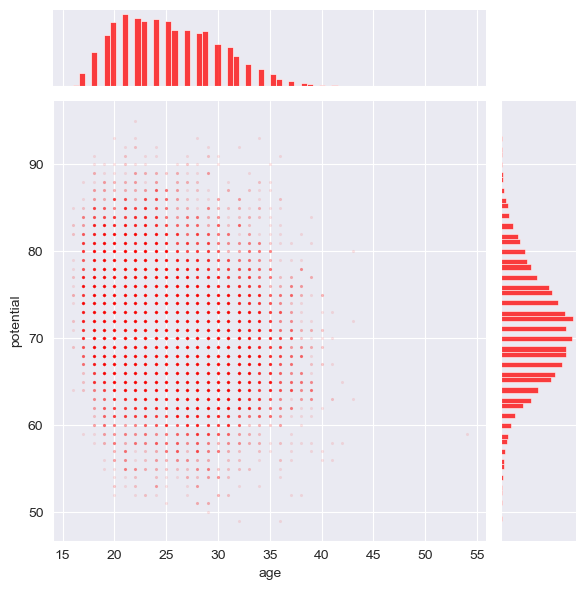

In [ ]:
import seaborn as sns

# Check for typos and correct the column name
sns.jointplot(x=df['age'],y=df['potential'], # Changed column names to lowercase
              joint_kws={'alpha':0.1,'s':5,'color':'red'},
              marginal_kws={'color':'red'})

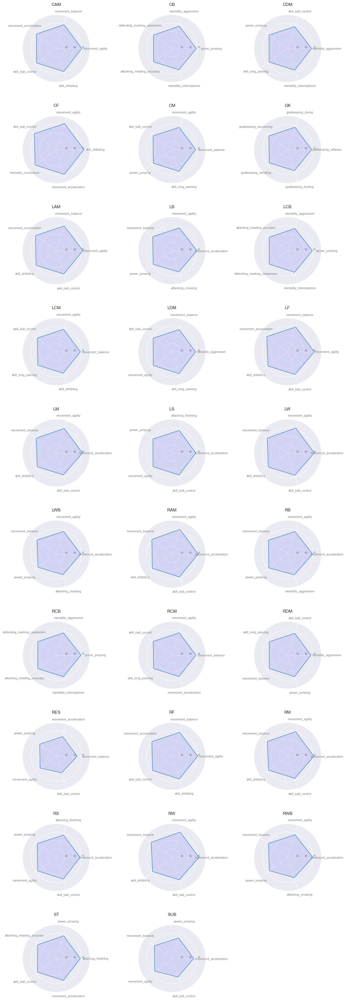

In [ ]:
import matplotlib.pyplot as plt
from math import pi

# Updated player features with correct column names in a list
player_features = [
    'movement_acceleration', 'mentality_aggression', 'movement_agility',
    'movement_balance', 'skill_ball_control', 'mentality_composure',
    'attacking_crossing', 'skill_dribbling', 'skill_fk_accuracy',
    'attacking_finishing', 'goalkeeping_diving', 'goalkeeping_handling',
    'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes',
    'attacking_heading_accuracy', 'mentality_interceptions', 'power_jumping',
    'skill_long_passing', 'power_long_shots', 'defending_marking_awareness', 'mentality_penalties'
]

# Create radar charts based on the features for each position
idx = 1
plt.figure(figsize=(15, 45))

# 
# Grouping by player positions and calculating mean for the selected features
for position_name, features in df.groupby('club_position')[player_features].mean().iterrows():
    top_features = dict(features.nlargest(5))  # Select the top 5 features for each position

    # Number of variables
    categories = top_features.keys()
    N = len(categories)

    # Values for radar chart, appending the first value to close the circle
    values = list(top_features.values())
    values += values[:1]

    # Angle for each axis in the radar chart
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialize subplot for radar chart
    ax = plt.subplot(10, 3, idx, polar=True)

    # Plot each feature's axis and add labels
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw y-labels and customize limits
    ax.set_rlabel_position(0)
    plt.yticks([25, 50, 75], ["25", "50", "75"], color="grey", size=7)
    plt.ylim(0, 100)

    plt.subplots_adjust(hspace=0.5)

    # Plot data on the radar chart
    ax.plot(angles, values, linewidth=1, linestyle='solid')

    # Fill area under the plot
    ax.fill(angles, values, 'b', alpha=0.1)

    # Add position name as the title
    plt.title(position_name, size=11, y=1.1)

    idx += 1

# Display the radar charts
plt.show()


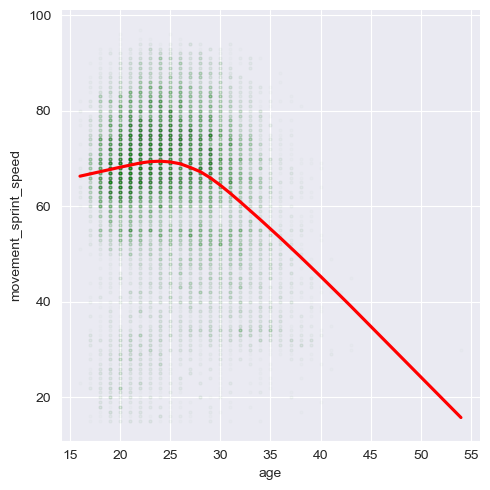

In [ ]:
sns.lmplot(data=df, x='age', y='movement_sprint_speed', lowess=True,
           scatter_kws={'alpha':0.01, 's':5, 'color':'green'},
           line_kws={'color':'red'})


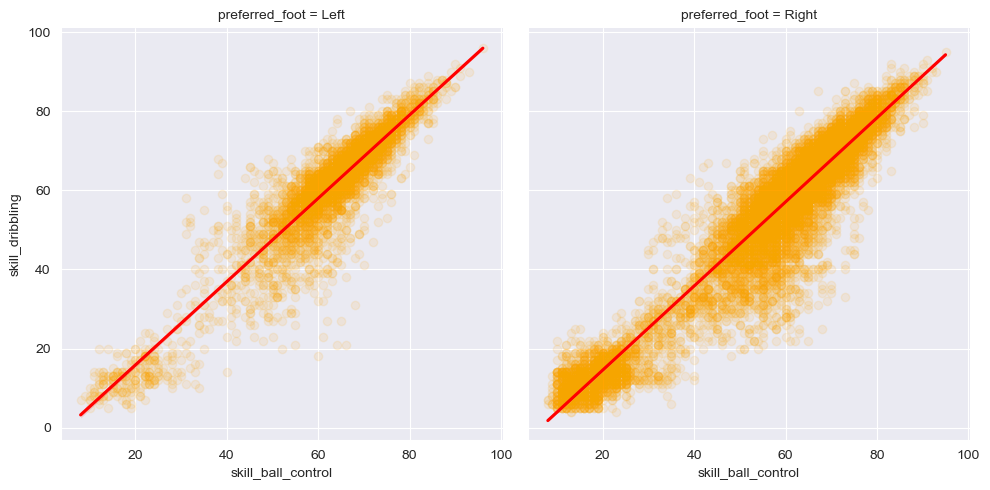

In [ ]:
sns.lmplot(x='skill_ball_control', y='skill_dribbling', data=df, col='preferred_foot',  # Changed 'ball_control' to 'skill_ball_control' and 'dribbling' to 'skill_dribbling'
           scatter_kws={'alpha': 0.1, 'color': 'orange'},
           line_kws={'color': 'red'})

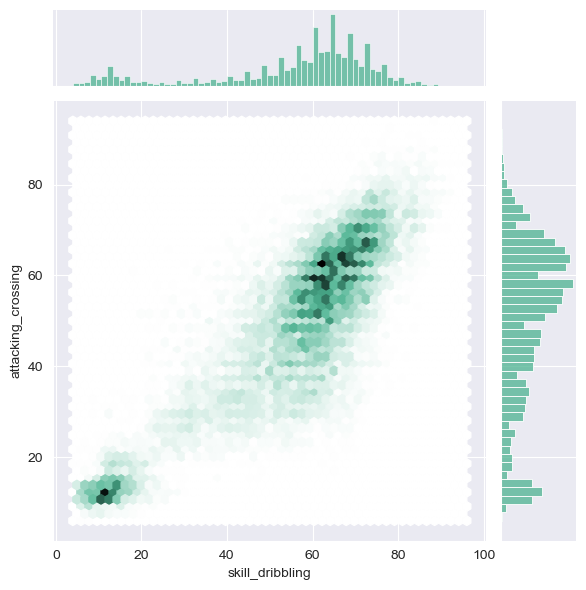

In [ ]:
sns.jointplot(x=df['skill_dribbling'], y=df['attacking_crossing'], kind="hex", color="#4CB391");  # Changed 'Dribbling' to 'skill_dribbling' and 'Crossing' to 'attacking_crossing'

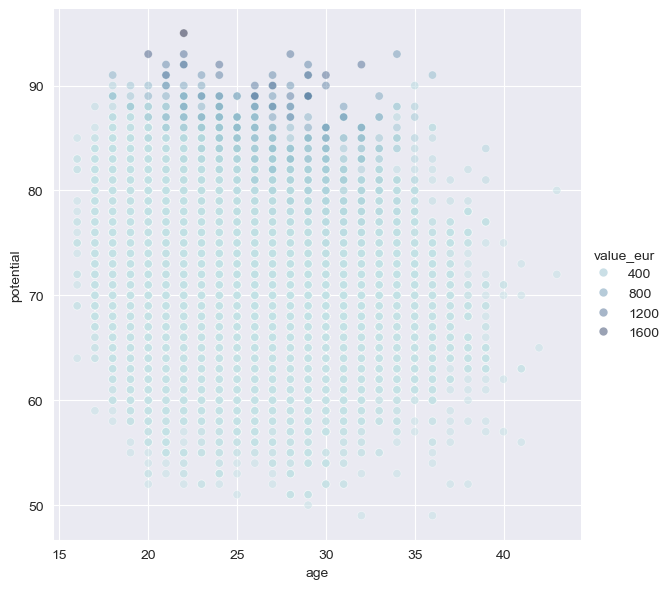

In [ ]:
# Ensure 'Value' column exists
value = df['value_eur']  # If the column is named 'value_eur' (based on your column names)
cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)

# Plotting
sns.relplot(x="age", y="potential", hue=value/100000,
            sizes=(40, 400), alpha=.5,
            height=6, palette=cmap, data=df)


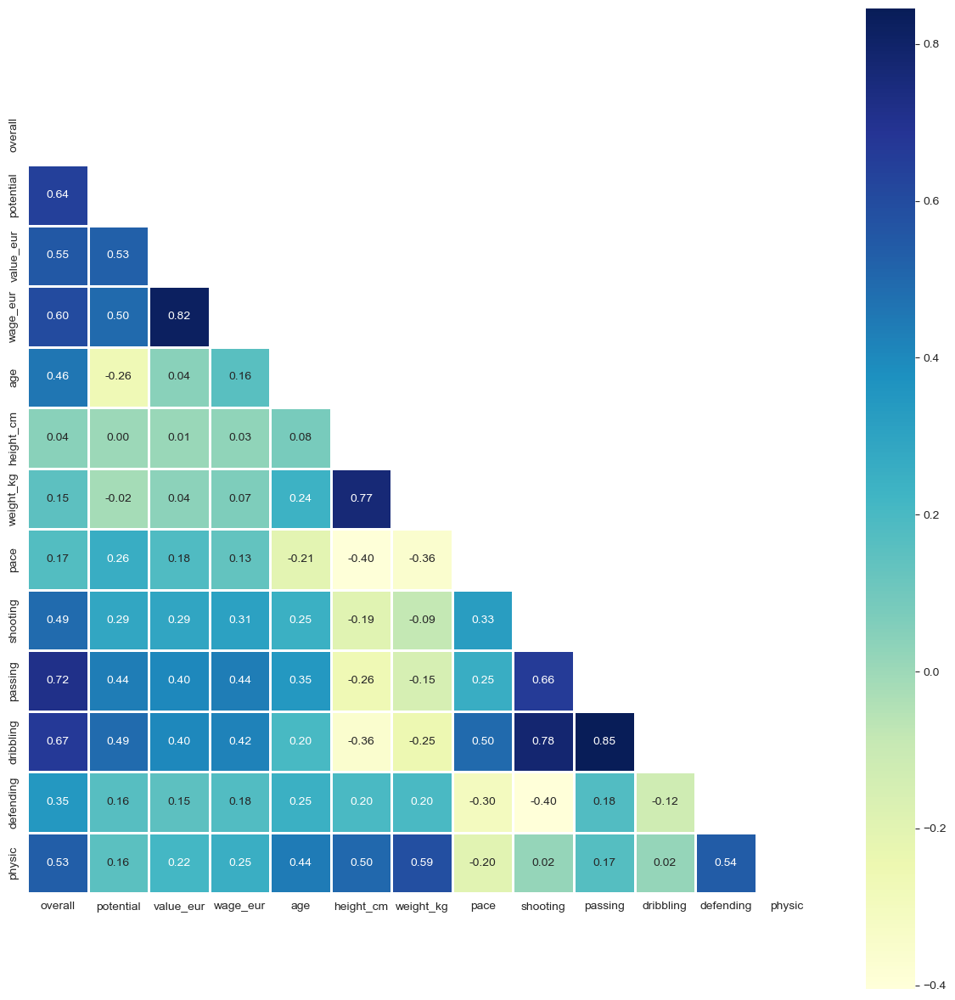

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Extracting relevant numerical columns for correlation
numerical_cols = ['overall', 'potential', 'value_eur', 'wage_eur', 'age', 'height_cm', 'weight_kg',
                  'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']

# Compute the correlation matrix
corr = df[numerical_cols].corr()

# Generate a mask for the upper triangle of the heatmap
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 15))

    # Draw the heatmap with the mask and correct aspect ratio
    ax = sns.heatmap(corr, mask=mask, square=True, linewidths=.8, cmap="YlGnBu", annot=True, fmt=".2f")

plt.show()


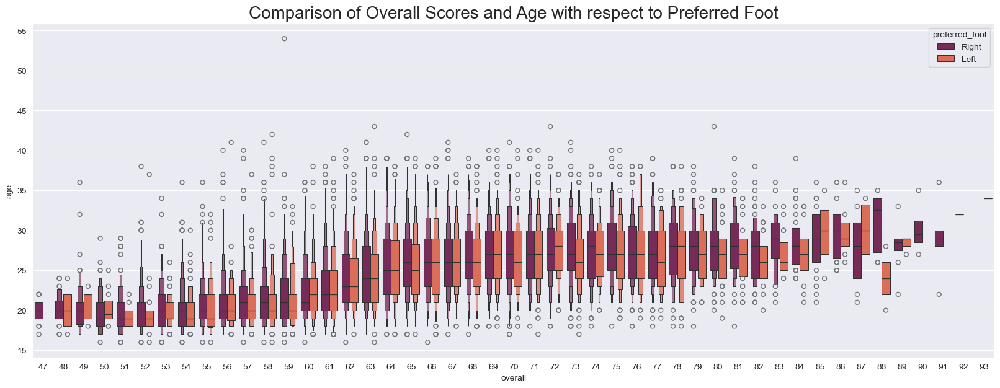

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the figure size and style
plt.rcParams['figure.figsize'] = (20, 7)
# plt.style.use('seaborn-dark-palette')

# Adjusting column names based on the dataset
sns.boxenplot(x='overall', y='age', hue='preferred_foot', data=df, palette='rocket')

# Setting the title
plt.title('Comparison of Overall Scores and Age with respect to Preferred Foot', fontsize=20)

# Display the plot
plt.show()


In [ ]:
# List of required columns
cols = ['age', 'overall', 'potential', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'preferred_foot']  # Updated column list

# Create a smaller DataFrame with selected columns
df_small = df[cols]

# Display the first few rows of the new DataFrame
df_small.head()

,age,overall,potential,pace,shooting,passing,dribbling,defending,physic,preferred_foot
0,34,93,93,85.0,92.0,91.0,95.0,34.0,65.0,Left
1,32,92,92,78.0,92.0,79.0,86.0,44.0,82.0,Right
2,36,91,91,87.0,94.0,80.0,88.0,34.0,75.0,Right
3,29,91,91,91.0,83.0,86.0,94.0,37.0,63.0,Right
4,30,91,91,76.0,86.0,93.0,88.0,64.0,78.0,Right


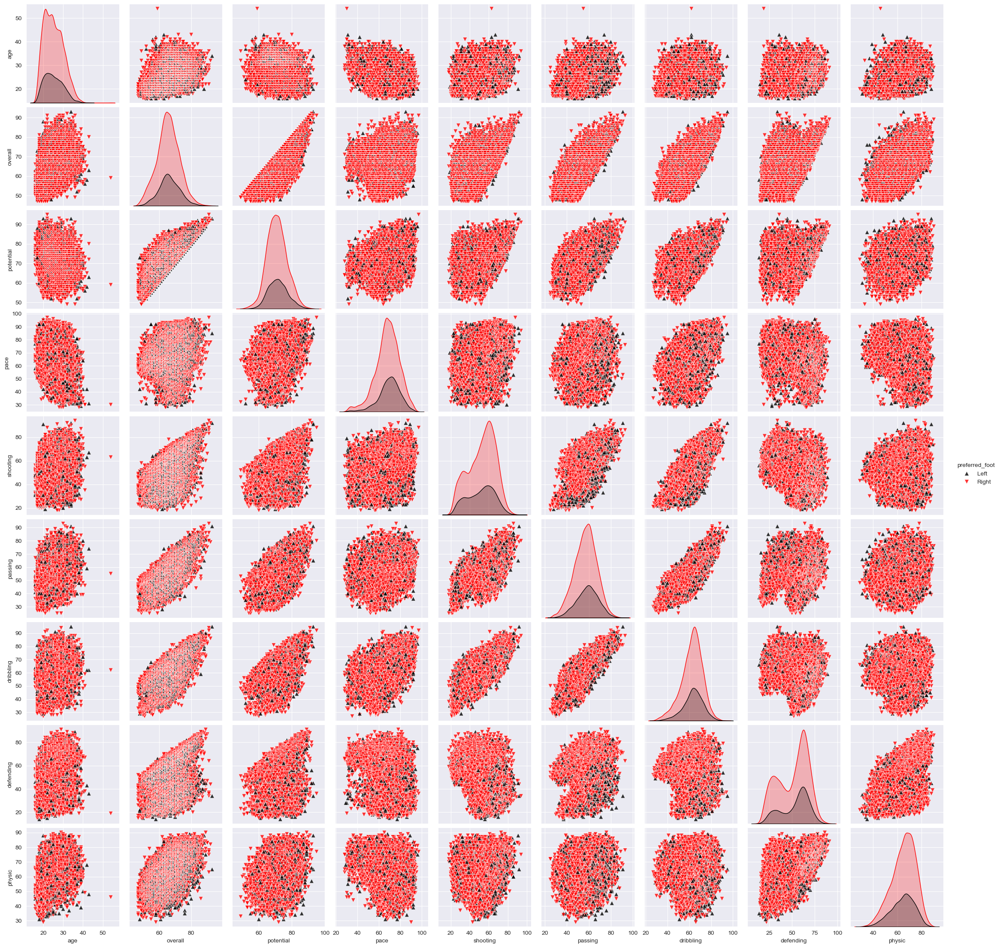

In [ ]:
# Ensure correct column names (adjusting for lowercase and underscores)
sns.pairplot(df_small, hue='preferred_foot', palette=["black", "red"],
             plot_kws=dict(s=50, alpha=0.8), markers=['^','v'])

# Display the plot
plt.show()


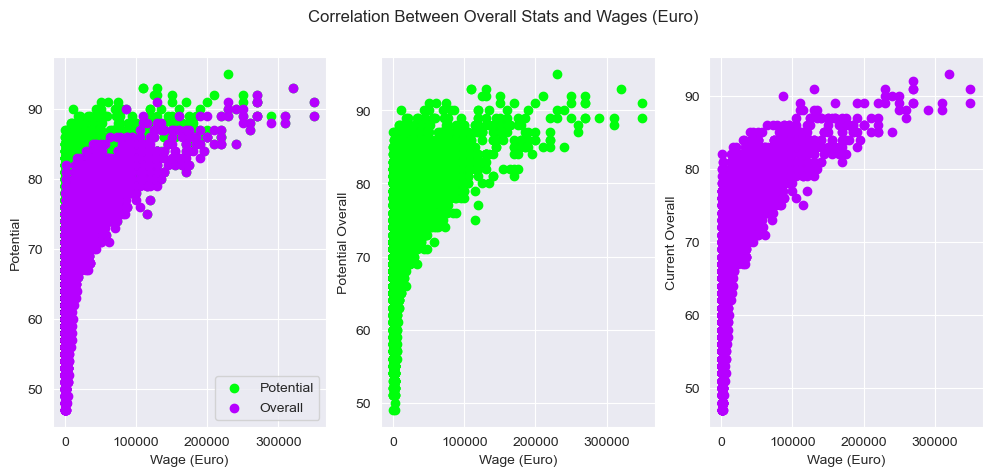

In [ ]:
wage_eur = df['wage_eur']
potential = df['potential']
overall = df['overall']
fig, ax = plt.subplots(figsize=(12,4.8),nrows=1, ncols=3)

ax[0].scatter(wage_eur, potential, label='Potential',color='#00ff0c')
ax[0].scatter(wage_eur, overall, label='Overall',color='#b600ff')
ax[1].scatter(wage_eur, potential, label='Potential',color='#00ff0c')
ax[2].scatter(wage_eur, overall, label='Overall',color='#b600ff')

ax[0].set(xlabel='Wage (Euro)')
ax[1].set(xlabel='Wage (Euro)')
ax[2].set(xlabel='Wage (Euro)')

ax[0].set(ylabel='Potential')
ax[1].set(ylabel='Potential Overall')
ax[2].set(ylabel='Current Overall')

ax[0].legend()

fig.suptitle('Correlation Between Overall Stats and Wages (Euro)')
plt.show()

Modelling

In [147]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df=pd.read_csv(r'C:\Users\kelvi\OneDrive\Desktop\semister-1 msaiml\ML\ML_project\dataset_fifa\players_22.csv')

C:\Users\kelvi\AppData\Local\Temp\ipykernel_17088\1744929286.py:5: DtypeWarning: Columns (25,108) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(r'C:\Users\kelvi\OneDrive\Desktop\semister-1 msaiml\ML\ML_project\dataset_fifa\players_22.csv')


In [148]:
drop_cols = df.columns[78:110]
df = df.drop(drop_cols, axis = 1)
df = df.drop(['sofifa_id','player_url', 'short_name', 'long_name','club_jersey_number', 'club_loaned_from', 'club_joined',
    'club_contract_valid_until', 'nationality_id', 'nationality_name','club_team_id', 'nation_team_id', 'nation_position' ,
               'height_cm', 'weight_kg','club_contract_valid_until','value_eur', 'wage_eur'], axis = 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Data columns (total 61 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   player_positions             19239 non-null  object 
 1   overall                      19239 non-null  int64  
 2   potential                    19239 non-null  int64  
 3   age                          19239 non-null  int64  
 4   dob                          19239 non-null  object 
 5   club_name                    19178 non-null  object 
 6   league_name                  19178 non-null  object 
 7   league_level                 19178 non-null  float64
 8   club_position                19178 non-null  object 
 9   nation_jersey_number         759 non-null    float64
 10  preferred_foot               19239 non-null  object 
 11  weak_foot                    19239 non-null  int64  
 12  skill_moves                  19239 non-null  int64  
 13  international_re

In [149]:


def right_footed(row):
    return 1 if row['preferred_foot'] == 'Right' else 0

def simple_position(row):
    if row['club_position'] == 'GK':
        return 'GK'
    elif row['club_position'] in ['RB', 'LB', 'CB', 'LCB', 'RCB', 'RWB', 'LWB']:
        return 'DF'
    elif row['club_position'] in ['LDM', 'CDM', 'RDM']:
        return 'DM'
    elif row['club_position'] in ['LM', 'LCM', 'CM', 'RCM', 'RM']:
        return 'MF'
    elif row['club_position'] in ['LAM', 'CAM', 'RAM', 'LW', 'RW']:
        return 'AM'
    elif row['club_position'] in ['RS', 'ST', 'LS', 'CF', 'LF', 'RF']:
        return 'ST'
    else:
        return row['club_position']

df1 = df.copy()

df1['Right_Foot'] = df1.apply(right_footed, axis=1)
df1['Simple_Position'] = df1.apply(simple_position, axis=1)
tempwork = df1["work_rate"].str.split("/", n=1, expand=True)
df1["WorkRate1"] = tempwork[0].str.strip()
df1["WorkRate2"] = tempwork[1].str.strip()

df1 = df1.drop(['work_rate', 'preferred_foot', 'club_position','real_face'], axis=1)
df1 = df1.drop(['player_positions', 'dob', 'club_name',
                'league_name', 'nation_jersey_number', 'release_clause_eur','player_tags'], axis=1)
df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Data columns (total 54 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   overall                      19239 non-null  int64  
 1   potential                    19239 non-null  int64  
 2   age                          19239 non-null  int64  
 3   league_level                 19178 non-null  float64
 4   weak_foot                    19239 non-null  int64  
 5   skill_moves                  19239 non-null  int64  
 6   international_reputation     19239 non-null  int64  
 7   body_type                    19239 non-null  object 
 8   player_traits                9398 non-null   object 
 9   pace                         17107 non-null  float64
 10  shooting                     17107 non-null  float64
 11  passing                      17107 non-null  float64
 12  dribbling                    17107 non-null  float64
 13  defending       

In [158]:
null_columns = df1.columns[df1.isnull().any()]
print("Columns with null values:", null_columns.tolist())

Columns with null values: ['league_level', 'player_traits', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'goalkeeping_speed', 'Simple_Position']


In [162]:
import pandas as pd
from sklearn.model_selection import train_test_split


df1[['league_level', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'goalkeeping_speed']] = df1[['league_level', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'goalkeeping_speed']].fillna(df1[['league_level', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'goalkeeping_speed']].mean())


target = df1['overall']  
df2 = df1.drop(['overall'], axis=1)  

X_train, X_test, y_train, y_test = train_test_split(df2, target, test_size=0.2, random_state=42)

X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

print(X_test.shape, X_train.shape)
print(y_test.shape, y_train.shape)


(3848, 999) (15391, 999)
(3848,) (15391,)


In [163]:
#Applying Linear Regression
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

#Finding the r2 score and root mean squared error
from sklearn.metrics import r2_score, mean_squared_error
print('r2 score: '+str(r2_score(y_test, predictions)))
print('RMSE : '+str(np.sqrt(mean_squared_error(y_test, predictions))))

r2 score: 0.9368837872662925
RMSE : 1.7186391650925732


In [92]:

from sklearn.metrics import mean_squared_error

def permutation_importance(model, X_test, y_test, metric=mean_squared_error):
    baseline_performance = metric(y_test, model.predict(X_test))

    importances = {}

    for col in X_test.columns:
        X_test_shuffled = X_test.copy()
        X_test_shuffled[col] = np.random.permutation(X_test[col])

        shuffled_performance = metric(y_test, model.predict(X_test_shuffled))

        importances[col] = shuffled_performance - baseline_performance

    importances_df = pd.DataFrame(importances.items(), columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)

    return importances_df

importances_df = permutation_importance(model, X_test, y_test)
print(importances_df.head(10))


                  Feature  Importance
0               potential   12.461526
1                     age    7.607903
7                    pace    6.272727
8                shooting    6.003324
24  movement_sprint_speed    5.885352
23  movement_acceleration    5.575563
26     movement_reactions    4.764815
14    attacking_finishing    4.135607
10              dribbling    2.237866
46   goalkeeping_reflexes    1.971857


C:\Users\kelvi\AppData\Local\Temp\ipykernel_17088\290260584.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=top_features, palette='viridis')


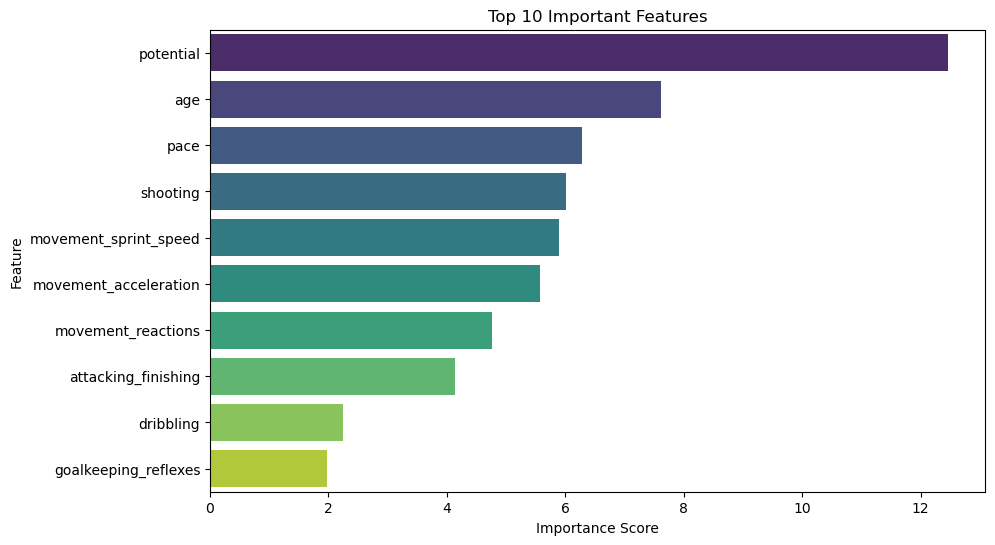

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importance(importances_df, top_n=10):
    top_features = importances_df.head(top_n)

    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=top_features, palette='viridis')

    plt.title(f'Top {top_n} Important Features')
    plt.xlabel('Importance Score')
    plt.ylabel('Feature')
    plt.show()

plot_feature_importance(importances_df, top_n=10)


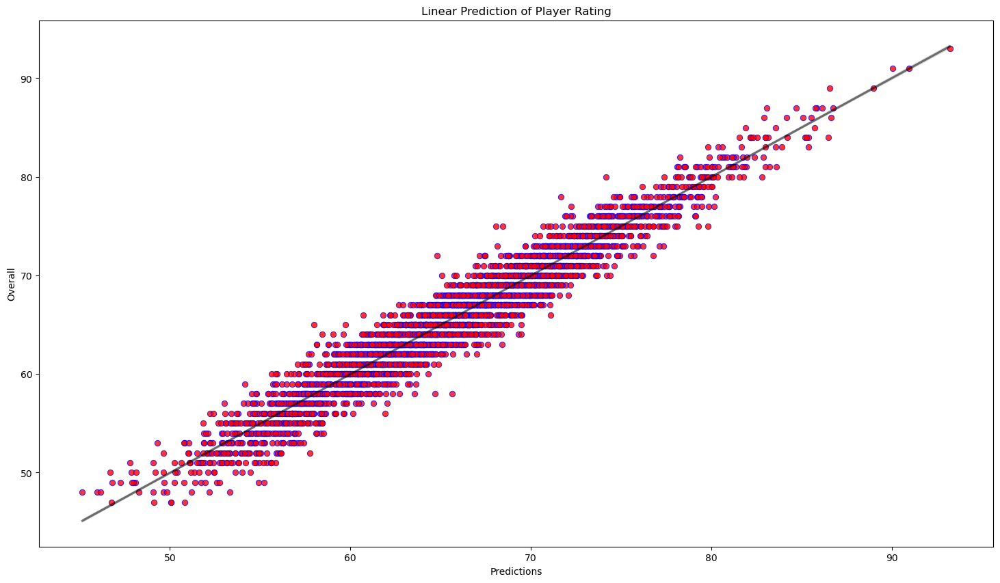

In [36]:
# Visualizing the results
plt.figure(figsize=(18,10))
sns.regplot(x=predictions, y=y_test,
            scatter_kws={'color':'red', 'edgecolor':'blue', 'linewidths':0.7},
            line_kws={'color':'black', 'alpha':0.5})

plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Linear Prediction of Player Rating")
plt.show()

In [137]:

df = pd.DataFrame(df1 ,columns=['goalkeeping_reflexes','dribbling','attacking_finishing','movement_reactions','pace','movement_sprint_speed','shooting','age','potential'])
df['dribbling'] = df['dribbling'].fillna(df['dribbling'].mean())
df['pace'] = df['pace'].fillna(df['pace'].mean())
df['shooting'] = df['shooting'].fillna(df['shooting'].mean())
target = df1['overall']
X_train, X_test, y_train, y_test = train_test_split(df, target, test_size=0.2, random_state=42)
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)
# Define the model
lr = LinearRegression()
lr.fit(X_train, y_train)
predictions = lr.predict(X_test)

#Finding the r2 score and root mean squared error
from sklearn.metrics import r2_score, mean_squared_error
print('r2 score: '+str(r2_score(y_test, predictions)))
print('RMSE : '+str(np.sqrt(mean_squared_error(y_test, predictions))))


r2 score: 0.9039445086918189
RMSE : 2.120192713635459


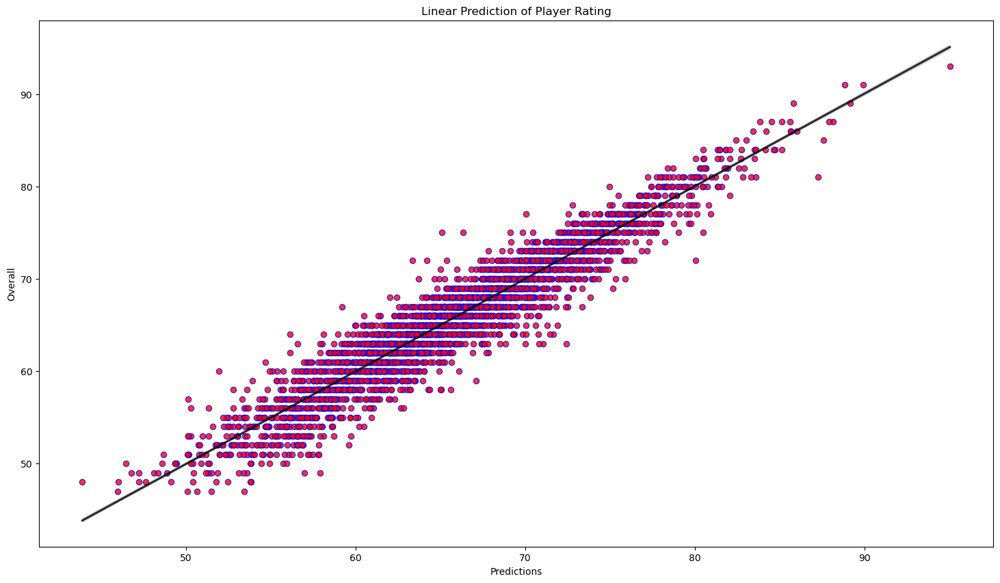

In [138]:
plt.figure(figsize=(18,10))
sns.regplot(x=predictions, y=y_test,
            scatter_kws={'color':'red', 'edgecolor':'blue', 'linewidths':0.9},
            line_kws={'color':'black', 'alpha':0.8})

plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Linear Prediction of Player Rating")
plt.show()

In [142]:
df=pd.read_csv('dataset_fifa\players_20.csv') 
df['dribbling'] = df['dribbling'].fillna(df['dribbling'].mean())
df['pace'] = df['pace'].fillna(df['pace'].mean())
df['shooting'] = df['shooting'].fillna(df['shooting'].mean())
features = pd.DataFrame(df ,columns=['goalkeeping_reflexes','dribbling','attacking_finishing','movement_reactions','pace','movement_sprint_speed','shooting','age','potential'])
target = df['overall']
predictions = lr.predict(features) 
df['predictions'] = predictions
print(df[['short_name','predictions','overall']].sample(10))

<>:1: SyntaxWarning: invalid escape sequence '\p'
<>:1: SyntaxWarning: invalid escape sequence '\p'
C:\Users\kelvi\AppData\Local\Temp\ipykernel_17088\63767062.py:1: SyntaxWarning: invalid escape sequence '\p'
  df=pd.read_csv('dataset_fifa\players_20.csv')


          short_name  predictions  overall
0           L. Messi    94.866484       94
1  Cristiano Ronaldo    95.472407       93
2          Neymar Jr    90.053651       92
3          E. Hazard    89.454562       91
4       K. De Bruyne    88.744127       91
5           J. Oblak    87.106427       91
6          L. Modrić    90.953176       90
7      M. ter Stegen    86.696220       90
8        V. van Dijk    86.590851       90
9           M. Salah    88.419942       90


In [199]:
import joblib
model_filename = 'lr.pkl'
joblib.dump(lr, model_filename)

['lr.pkl']

C:\Users\kelvi\AppData\Local\Temp\ipykernel_13636\973875429.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_value_prediction['value_category'] = pd.cut(
C:\Users\kelvi\AppData\Local\Temp\ipykernel_13636\973875429.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_value_prediction['age_group'] = pd.cut(


Accuracy: 0.9900930651456019
Classification Report:
                 precision    recall  f1-score   support

     High Value       0.89      0.94      0.91       108
      Low Value       1.00      1.00      1.00      2497
   Medium Value       0.98      0.98      0.98       589
Very High Value       0.96      0.98      0.97       137

       accuracy                           0.99      3331
      macro avg       0.96      0.97      0.96      3331
   weighted avg       0.99      0.99      0.99      3331



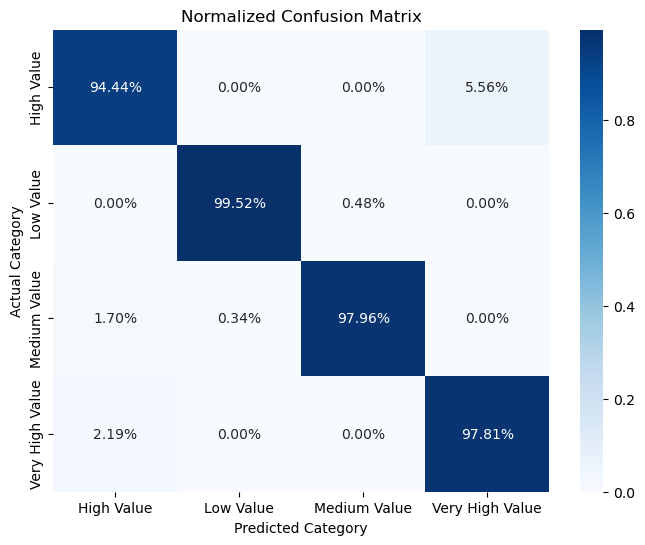

C:\Users\kelvi\AppData\Local\Temp\ipykernel_13636\973875429.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importances[indices], y=np.array(features)[indices], palette="viridis")


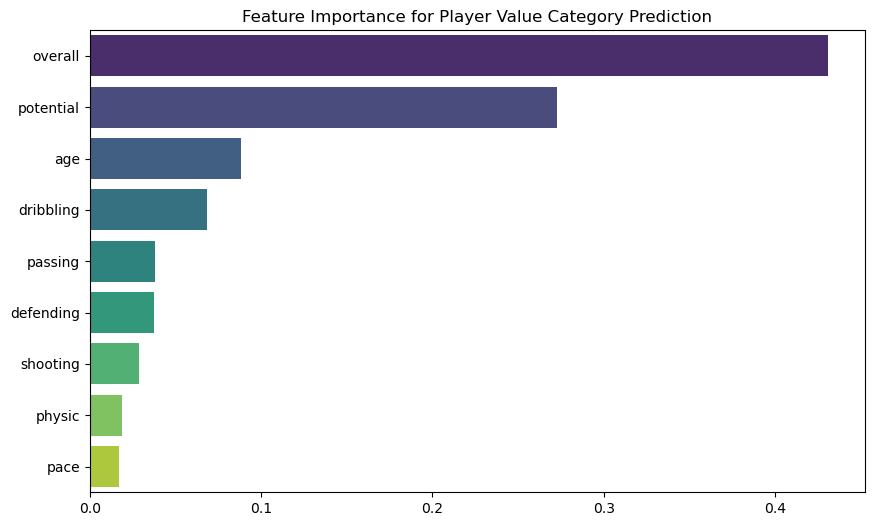

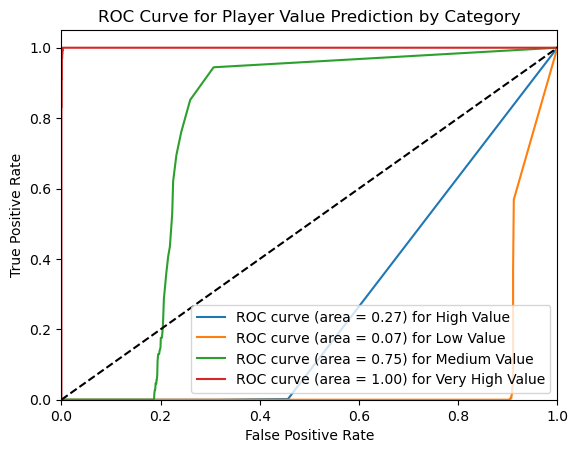

C:\Users\kelvi\AppData\Local\Temp\ipykernel_13636\973875429.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_pred, palette="coolwarm", order=rf_model.classes_)


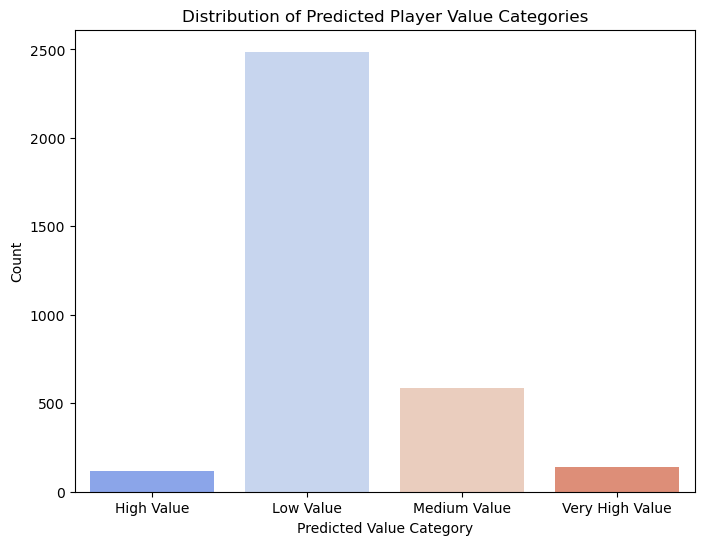

['rf.pkl']

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import precision_recall_curve
df = pd.read_csv('dataset_fifa/players_21.csv')

features = ['age', 'overall', 'potential', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']
target = 'value_eur'

df_value_prediction = df.dropna(subset=features + [target])
df_value_prediction['value_category'] = pd.cut(
    df_value_prediction[target],
    bins=[0, 2e6, 8e6, 15e6, df_value_prediction[target].max()],
    labels=['Low Value', 'Medium Value', 'High Value', 'Very High Value']
)
df_value_prediction['age_group'] = pd.cut(
    df_value_prediction['age'], bins=[15, 22, 28, 35, 50], labels=['Young', 'Peak', 'Post-Peak', 'Veteran']
)

df_value_prediction = pd.get_dummies(df_value_prediction, columns=['age_group'], drop_first=True)

X = df_value_prediction[features]
y = df_value_prediction['value_category']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

rf_model = RandomForestClassifier(n_estimators=83, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Classification Report:\n{classification_report(y_test, y_pred)}')

plt.figure(figsize=(8, 6))
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues', xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.title('Normalized Confusion Matrix')
plt.xlabel('Predicted Category')
plt.ylabel('Actual Category')
plt.show()

feature_importances = rf_model.feature_importances_
indices = np.argsort(feature_importances)[::-1]
plt.figure(figsize=(10, 6))
plt.title("Feature Importance for Player Value Category Prediction")
sns.barplot(x=feature_importances[indices], y=np.array(features)[indices], palette="viridis")
plt.show()

y_test_bin = pd.get_dummies(y_test)
y_pred_prob = rf_model.predict_proba(X_test)

for i, class_name in enumerate(rf_model.classes_):
    fpr, tpr, _ = roc_curve(y_test_bin.iloc[:, i], y_pred_prob[:, i])
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc_score(y_test_bin.iloc[:, i], y_pred_prob[:, i]):.2f}) for {class_name}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('ROC Curve for Player Value Prediction by Category')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()


plt.figure(figsize=(8, 6))
sns.countplot(x=y_pred, palette="coolwarm", order=rf_model.classes_)
plt.title("Distribution of Predicted Player Value Categories")
plt.xlabel("Predicted Value Category")
plt.ylabel("Count")
plt.show()
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import Image
import pydotplus

tree = rf_model.estimators_[0]

dot_data = export_graphviz(
    tree, 
    out_file=None, 
    feature_names=features, 
    class_names=rf_model.classes_, 
    filled=True, 
    rounded=True,
    special_characters=True
)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())
import joblib

model_filename = 'rf.pkl'
joblib.dump(rf_model, model_filename)

Injury Prediction

<>:17: SyntaxWarning: invalid escape sequence '\i'
<>:17: SyntaxWarning: invalid escape sequence '\i'
C:\Users\kelvi\AppData\Local\Temp\ipykernel_16352\1110146756.py:17: SyntaxWarning: invalid escape sequence '\i'
  df = pd.read_csv('dataset_injury\injury_data.csv')


,Player_Age,Player_Weight,Player_Height,Previous_Injuries,Training_Intensity,Recovery_Time,Likelihood_of_Injury
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,28.23,74.79,179.75,0.52,0.49,3.47,0.50
std,6.54,9.89,9.89,0.50,0.29,1.70,0.50
min,18.00,40.19,145.29,0.00,0.00,1.00,0.00
25%,22.00,67.95,173.03,0.00,0.24,2.00,0.00
50%,28.00,75.02,180.03,1.00,0.48,4.00,0.50
75%,34.00,81.30,186.56,1.00,0.73,5.00,1.00
max,39.00,104.65,207.31,1.00,1.00,6.00,1.00


Player Age Min: 18
Player Age Max: 39


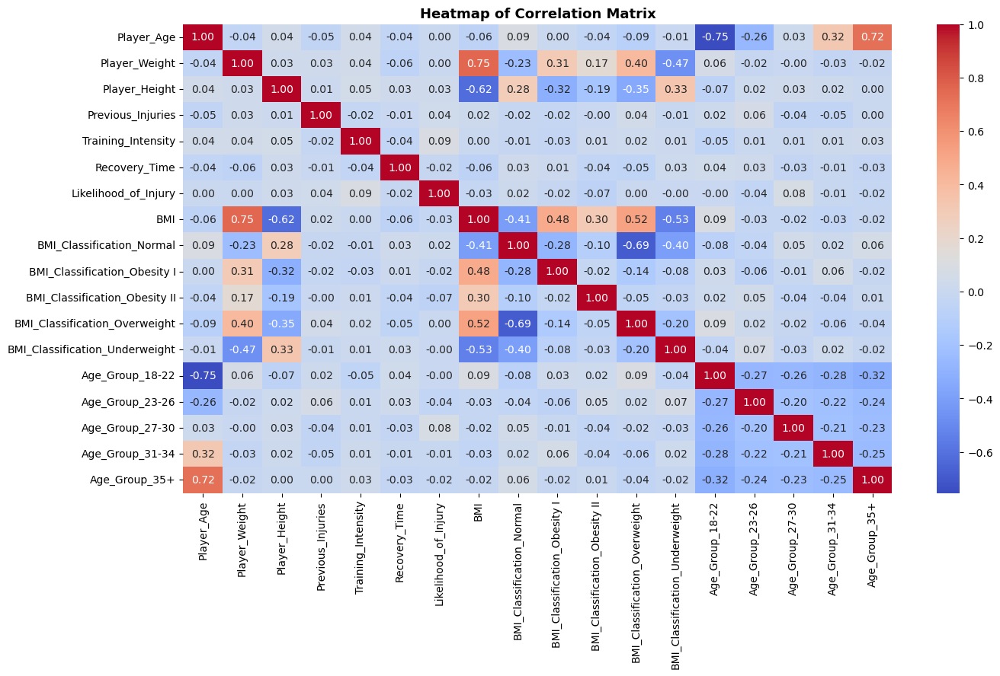

C:\Users\kelvi\AppData\Local\Temp\ipykernel_16352\1110146756.py:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlation_with_likelihood.index, y=correlation_with_likelihood.values, palette='coolwarm')


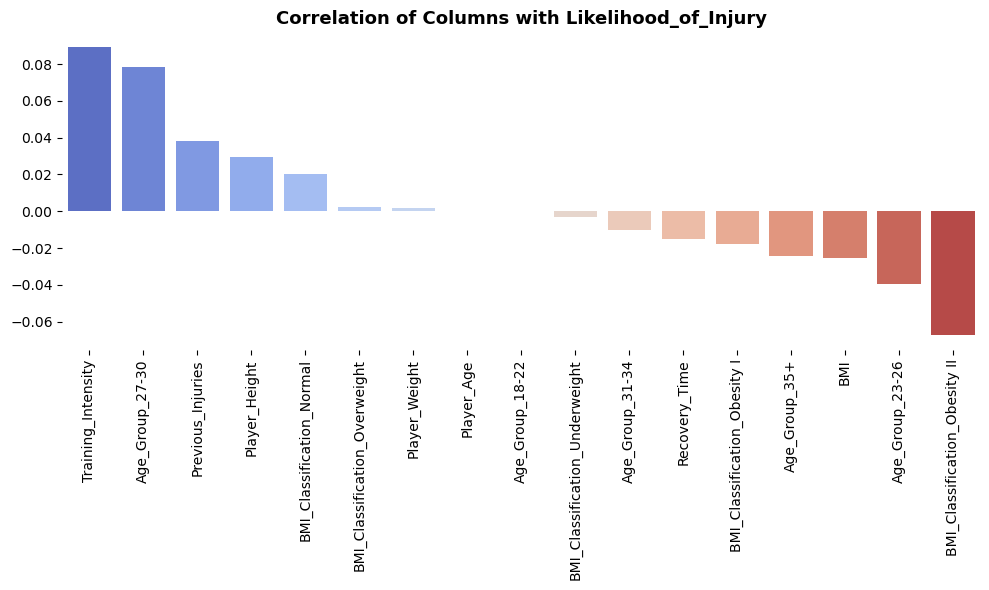

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 441, number of negative: 459
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 651
[LightGBM] [Info] Number of data points in the train set: 900, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.490000 -> initscore=-0.040005
[LightGBM] [Info] Start training from score -0.040005
Model: LGBMClassifier
Recall: 0.5423728813559322
Accuracy: 0.61
Precision: 0.7272727272727273
--------------------------------------------------


c:\Users\kelvi\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Model: AdaBoostClassifier
Recall: 0.576271186440678
Accuracy: 0.6
Precision: 0.6938775510204082
--------------------------------------------------
Model: ExtraTreesClassifier
Recall: 0.559322033898305
Accuracy: 0.61
Precision: 0.717391304347826
--------------------------------------------------
Model: NuSVC
Recall: 0.8135593220338984
Accuracy: 0.59
Precision: 0.6153846153846154
--------------------------------------------------
Model: ExtraTreeClassifier
Recall: 0.5254237288135594
Accuracy: 0.52
Precision: 0.6078431372549019
--------------------------------------------------


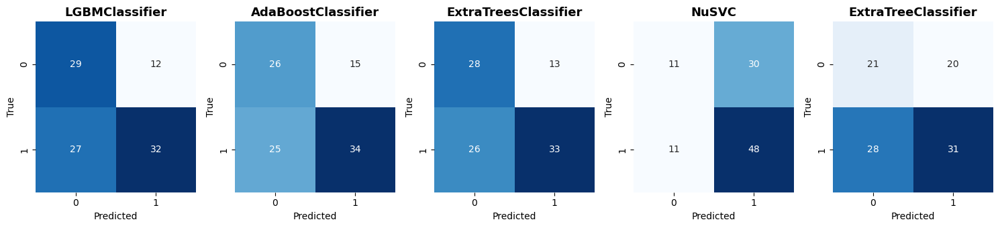

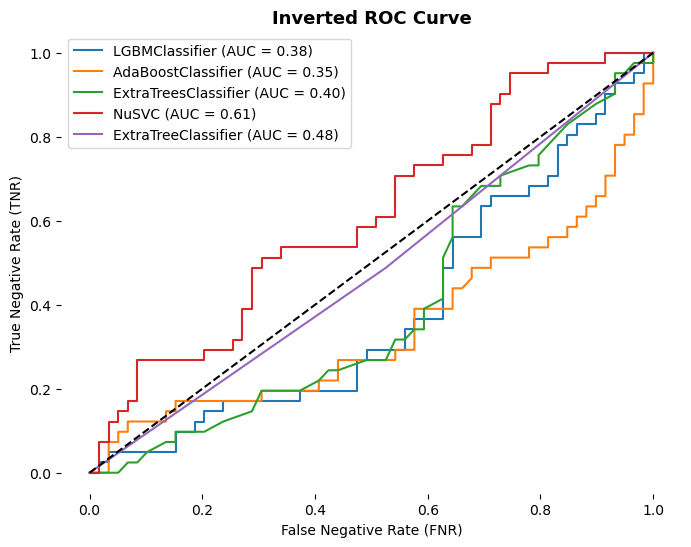

In [ ]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sklearn
from platform import python_version
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier, AdaBoostClassifier
from sklearn.svm import NuSVC
from sklearn.tree import ExtraTreeClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, accuracy_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
df = pd.read_csv('dataset_injury\injury_data.csv')
df['Player_Weight'] = df['Player_Weight'].round(2)
df['Player_Height'] = df['Player_Height'].round(2)
df['Training_Intensity'] = df['Training_Intensity'].round(2)
df_info = pd.DataFrame(df.dtypes, columns=['Dtype'])
df_info['Unique'] = df.nunique().values
df_info['Null'] = df.isnull().sum().values
with pd.option_context(
    "display.float_format",
    "{:.2f}".format,
    "display.max_columns",
    None,
):
    display(df.describe())
df['BMI'] = df['Player_Weight'] / (df['Player_Height'] / 100) ** 2

gaps = [-float('inf'), 18.5, 24.9, 29.9, 34.9, 39.9, float('inf')]
categories = ['Underweight', 'Normal', 'Overweight', 'Obesity I', 'Obesity II', 'Obesity III']

df['BMI_Classification'] = pd.cut(df['BMI'], bins=gaps, labels=categories, right=False)

print('Player Age Min: {}'.format(df.Player_Age.min()))
print('Player Age Max: {}'.format(df.Player_Age.max()))
df["Age_Group"] = pd.cut(
    df["Player_Age"],
    bins=[18, 22, 26, 30, 34, df["Player_Age"].max()],
    labels=["18-22", "23-26", "27-30", "31-34", "35+"],
    include_lowest=True,
)
# Categorical columns
one_hot_cols = [
    "BMI_Classification",
    "Age_Group",
]

df_categorical = df[one_hot_cols]

encoder = OneHotEncoder()
encoded_data = encoder.fit_transform(df_categorical)

one_hot_feature_names = encoder.get_feature_names_out(one_hot_cols)
df_encoded = pd.DataFrame(encoded_data.toarray(), columns=one_hot_feature_names)

df_final = pd.concat([df, df_encoded], axis=1)

df_final.drop(columns=['BMI_Classification', 'Age_Group'], inplace=True)
correlation_matrix = df_final.corr()

plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Correlation Matrix', weight='bold', size=13)
plt.show()
correlation_matrix = df_final.corr()

correlation_with_likelihood = correlation_matrix['Likelihood_of_Injury']

correlation_with_likelihood = correlation_with_likelihood.drop('Likelihood_of_Injury')

correlation_with_likelihood = correlation_with_likelihood.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_with_likelihood.index, y=correlation_with_likelihood.values, palette='coolwarm')
plt.xticks(rotation=90, ha='center')
plt.xlabel('')
plt.ylabel('')
plt.box(False)
plt.title('Correlation of Columns with Likelihood_of_Injury', weight='bold', size=13)
plt.tight_layout()
plt.show()
df_final = df_final.loc[:, ~df_final.columns.str.startswith('Age_Group')]

df_final = df_final.drop(columns=['BMI'])
X = df_final.drop('Likelihood_of_Injury', axis=1)

y = df_final['Likelihood_of_Injury']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score

models = {
    "LGBMClassifier": LGBMClassifier(),
    "AdaBoostClassifier": AdaBoostClassifier(),
    "ExtraTreesClassifier": ExtraTreesClassifier(),
    "NuSVC": NuSVC(probability=True),
    "ExtraTreeClassifier": ExtraTreeClassifier(),
    }
for model_name, model in models.items():
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    recall = recall_score(y_test, predictions)
    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions)

    print(f"Model: {model_name}")
    print(f"Recall: {recall}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print("-" * 50)
    # Create figure and axes
fig, axes = plt.subplots(1, len(models), figsize=(15, 3.5))

for ax, (model_name, model) in zip(axes, models.items()):
    predictions = model.predict(X_test)
    cm = confusion_matrix(y_test, predictions)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, ax=ax)
    ax.set_title(f"{model_name}", weight='bold', size=13)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")

plt.tight_layout()
plt.show()
plt.figure(figsize=(8, 6))
for model_name, model in models.items():
    y_proba = model.predict_proba(X_test)[:, 0]  # Probabilities of belonging to the negative class
    fpr, tpr, _ = roc_curve(y_test, y_proba)

    tnr = 1 - fpr  
    fnr = 1 - tpr  

    auc = roc_auc_score(y_test, y_proba)
    plt.plot(fnr, tnr, label=f'{model_name} (AUC = {auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], linestyle='--', color='black')

plt.xlabel('False Negative Rate (FNR)')
plt.ylabel('True Negative Rate (TNR)')
plt.title('Inverted ROC Curve', weight='bold', size=13)
plt.legend()
plt.box(False)  # Remove plot borders
plt.show()

Clustering

This block of code performs clustering on player data and visualizes the results using a scatter plot. The KMeans algorithm is used to form clusters of players based on their attributes. Principal Component Analysis (PCA) is then applied to reduce the high-dimensional data into two principal components (PCA 1 and PCA 2) for easier visualization. Each cluster is represented by a distinct color in the scatter plot.

What it shows: The scatter plot visualizes the clusters formed by the KMeans algorithm, with each cluster of players represented by a distinct color. The points are plotted using Principal Component Analysis (PCA), which reduces the high-dimensional feature space (pace, shooting, passing, etc.) into two principal components (PCA 1 and PCA 2) for visualization.
Insight: This visualization shows how players group together based on their performance metrics and market value. Players within the same cluster are more similar to each other, while those in different clusters are more distinct in terms of their performance attributes.
Cluster Analysis: It helps in identifying different player profiles, like budget players with decent performance or high-performance stars with high market value.
Key Takeaway: This clustering analysis helps in understanding the different types of players available in the market based on their attributes and value, which can assist in transfer decisions or team building.

<>:9: SyntaxWarning: invalid escape sequence '\p'
<>:9: SyntaxWarning: invalid escape sequence '\p'
C:\Users\kelvi\AppData\Local\Temp\ipykernel_1824\985907749.py:9: SyntaxWarning: invalid escape sequence '\p'
  df = pd.read_csv('dataset_fifa\players_22.csv')
C:\Users\kelvi\AppData\Local\Temp\ipykernel_1824\985907749.py:9: DtypeWarning: Columns (25,108) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('dataset_fifa\players_22.csv')


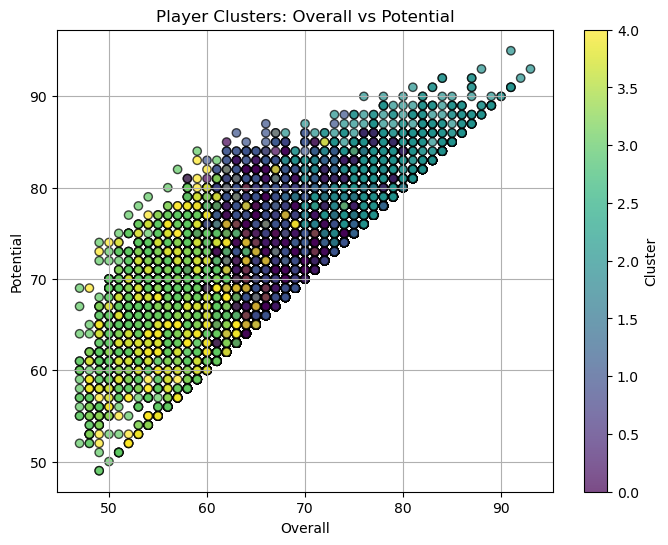

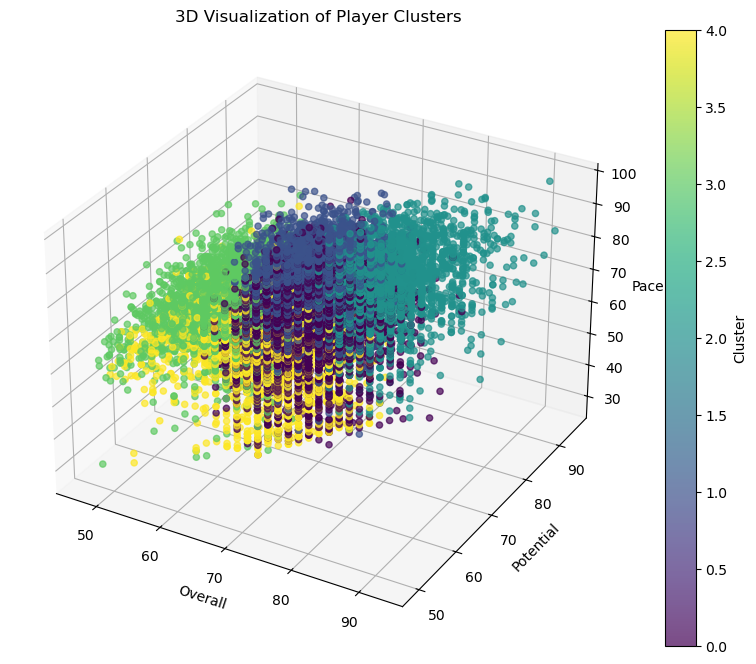

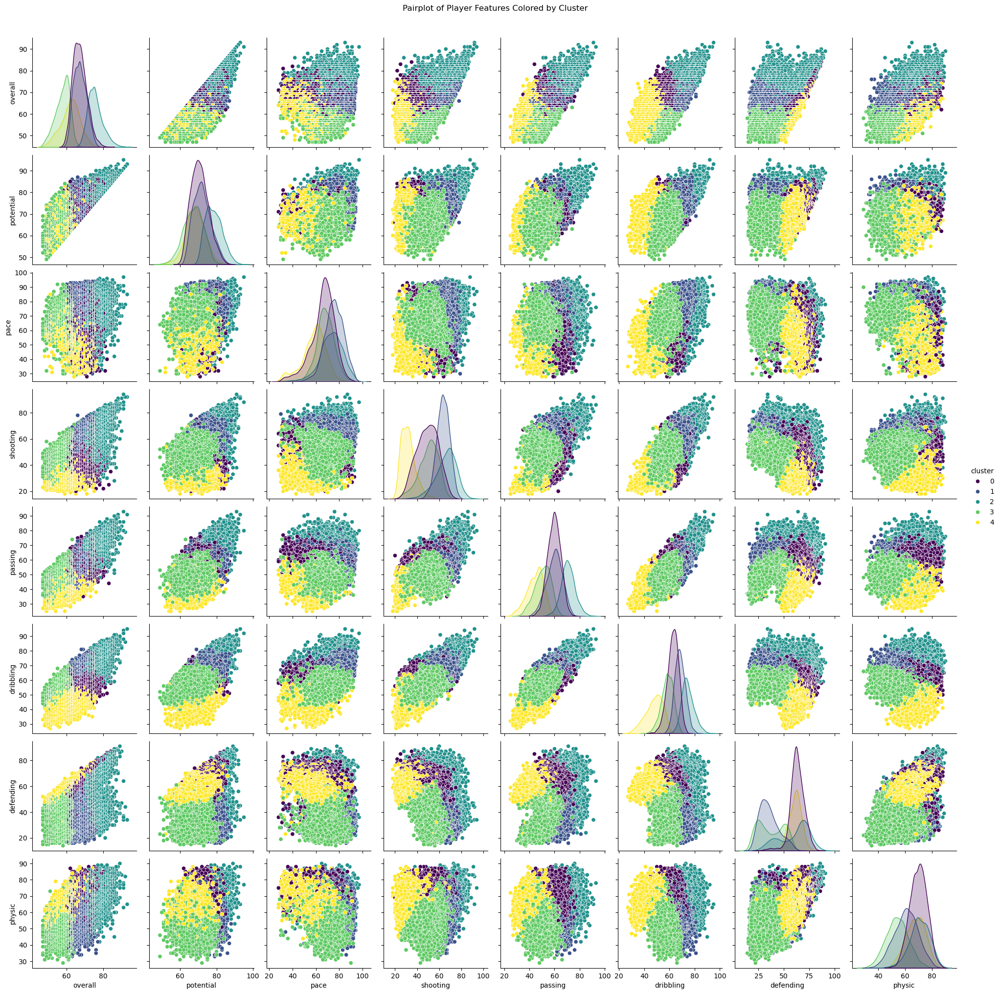

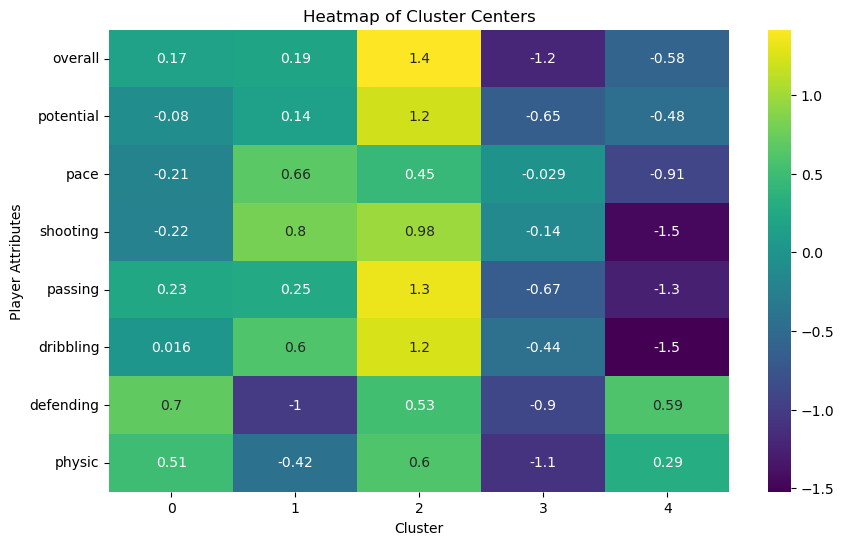

         short_name  cluster
3941        Escassi        0
11678       C. Lang        1
16375  M. Dijakovic        4
6284      J. Mellot        0
538        Ai Kesen        2


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset
df = pd.read_csv('dataset_fifa\players_22.csv')

# Preprocess the data
features = ['overall', 'potential', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']

# Drop rows with missing values in features
df = df.dropna(subset=features)

X = df[features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Assuming 5 clusters
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to the dataframe
df['cluster'] = clusters

# Visualization 1: 2D scatter plot of 'Overall' vs 'Potential'
plt.figure(figsize=(8, 6))
plt.scatter(df['overall'], df['potential'], c=df['cluster'], cmap='viridis', alpha=0.7, edgecolor='k')
plt.xlabel('Overall')
plt.ylabel('Potential')
plt.title('Player Clusters: Overall vs Potential')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

# Visualization 2: 3D scatter plot of 'Overall', 'Potential', and 'Pace'
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df['overall'], df['potential'], df['pace'], c=df['cluster'], cmap='viridis', alpha=0.7)

ax.set_xlabel('Overall')
ax.set_ylabel('Potential')
ax.set_zlabel('Pace')
ax.set_title('3D Visualization of Player Clusters')
plt.colorbar(scatter, label='Cluster')
plt.show()

# Visualization 3: Pairplot for better understanding of relationships
sns.pairplot(df[features + ['cluster']], hue='cluster', palette='viridis')
plt.suptitle('Pairplot of Player Features Colored by Cluster', y=1.02)
plt.show()

# Visualization 4: Heatmap of Cluster Centers
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features)
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_centers.T, annot=True, cmap='viridis', cbar=True, yticklabels=features)
plt.title('Heatmap of Cluster Centers')
plt.xlabel('Cluster')
plt.ylabel('Player Attributes')
plt.show()

# Display 5 random data points with cluster labels
print(df[['short_name', 'cluster']].sample(5))
